<a href="https://colab.research.google.com/github/aadya20245001/Error-Vision_Quest-/blob/main/vision_quest.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!nvidia-smi

!pip install ultralytics opencv-python-headless filterpy lap kaggle -q


Sun Dec  7 11:18:09 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   43C    P8              9W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [7]:
import os, json

# ⬇⬇⬇  YAHAN APNA USERNAME & KEY BHARO  ⬇⬇⬇
USERNAME = "jigyasa satsangi"      # e.g. "jigyasa_satsangi"
KEY      = "KGAT_865b9246eb5aed42bcb08770e570930f"       # long random string

api_token = {"username": USERNAME, "key": KEY}

os.makedirs(os.path.expanduser("~/.kaggle"), exist_ok=True)
with open(os.path.expanduser("~/.kaggle/kaggle.json"), "w") as f:
    json.dump(api_token, f)

!chmod 600 ~/.kaggle/kaggle.json

# Test: Kaggle API kaam kar rahi hai ya nahi
!kaggle datasets list -s "yolo-drone-detection-dataset"


ref                                                              title                                                      size  lastUpdated                 downloadCount  voteCount  usabilityRating  
---------------------------------------------------------------  --------------------------------------------------  -----------  --------------------------  -------------  ---------  ---------------  
muki2003/yolo-drone-detection-dataset                            YOLO Drone Detection Dataset                          376941316  2022-07-24 15:17:30.717000           6771         45  0.9375           
banuprasadb/visdrone-dataset                                     VisDrone Dataset                                     2251268022  2025-06-28 12:49:31.430000           1804         48  1.0              
sshikamaru/drone-yolo-detection                                  Drone Object Detection                                165062240  2022-06-22 19:59:45.347000           5312         69  0.9375  

In [8]:
!kaggle datasets download -d muki2003/yolo-drone-detection-dataset -p /content


Dataset URL: https://www.kaggle.com/datasets/muki2003/yolo-drone-detection-dataset
License(s): other
 85% 304M/359M [00:02<00:00, 111MB/s] 
100% 359M/359M [00:02<00:00, 149MB/s]


In [9]:
!unzip -q /content/yolo-drone-detection-dataset.zip -d /content/drone_dataset


In [10]:
!ls /content/drone_dataset


drone_dataset


In [12]:
!ls /content/drone_dataset/drone_dataset


data.yaml  train  valid


In [13]:
%%writefile drone.yaml
path: /content/drone_dataset/drone_dataset
train: train
val: valid

nc: 1
names: ['drone']


Writing drone.yaml


In [16]:
from ultralytics import YOLO

# Pretrained YOLOv8 se fine-tuning (this counts as proper training ✅)
model = YOLO("yolov8n.pt")

model.train(
    data="drone.yaml",
    epochs=6,     # chaaho to 30 bhi kar sakti ho
    imgsz=640,
    batch=16,
    device=0
)


Ultralytics 8.3.235 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=drone.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=6, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train2, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=True, pose=12.0, pretrained=True,

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7e7820250bf0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.048048, 

In [17]:
from google.colab import files
files.download("runs/detect/train/weights/best.pt")


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [7]:
from google.colab import files
files.upload()


Saving drone.mp4 to drone.mp4


{'drone.mp4': b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\n\xffmoov\x00\x00\x00lmvhd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\xe8\x00\x00\x1a\xdb\x00\x01\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00@\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\n)trak\x00\x00\x00\\tkhd\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x1a\xdb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00@\x00\x00\x00\x02T\x00\x00\x01P\x00\x00\x00\x00\x00$edts\x00\x00\x00\x1celst\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x1a\xdb\x00\x00\x04\x00\x00\x01\x00\x00\x00\x00\t\xa1mdia\x00

✅ Model loaded!


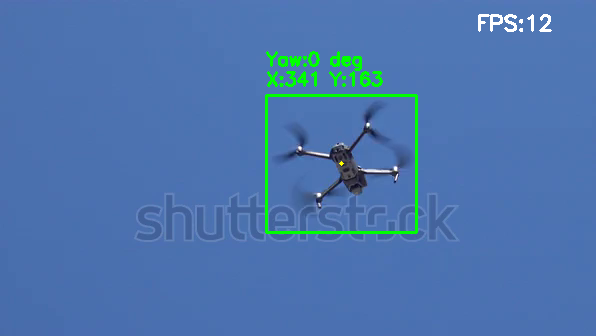

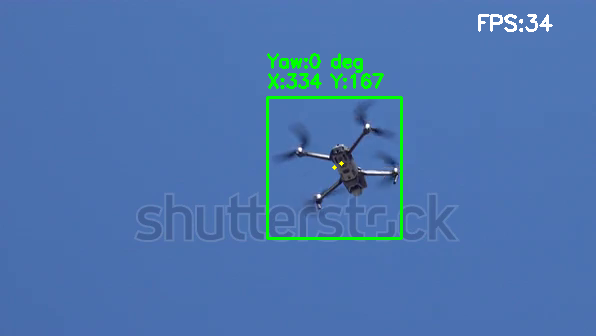

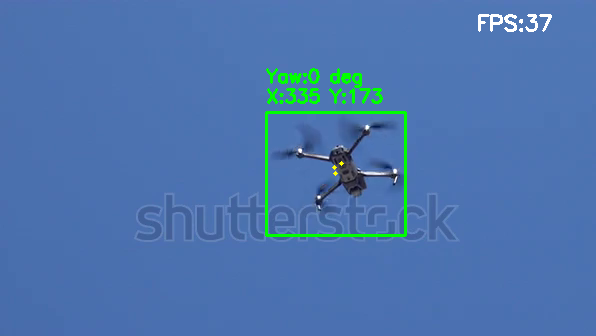

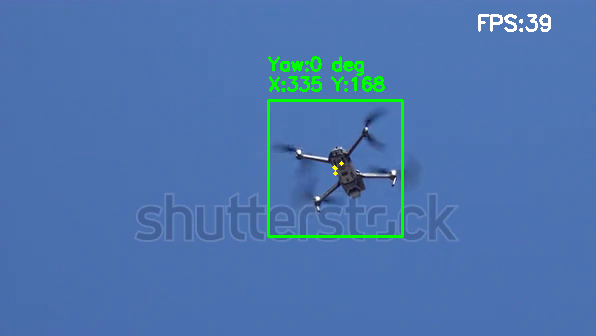

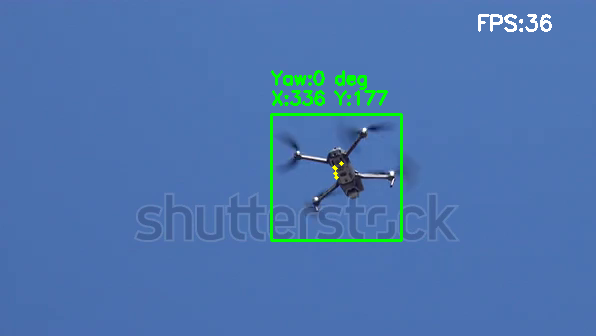

...

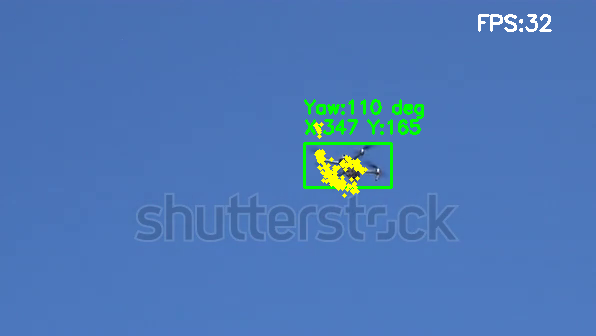

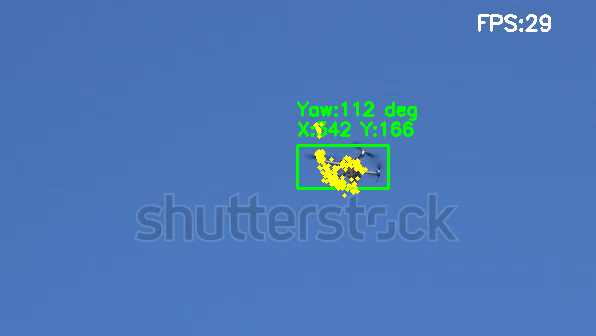

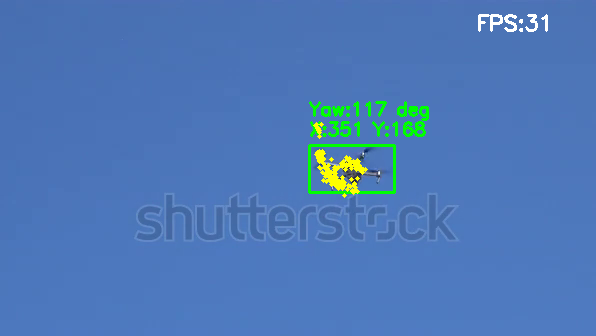

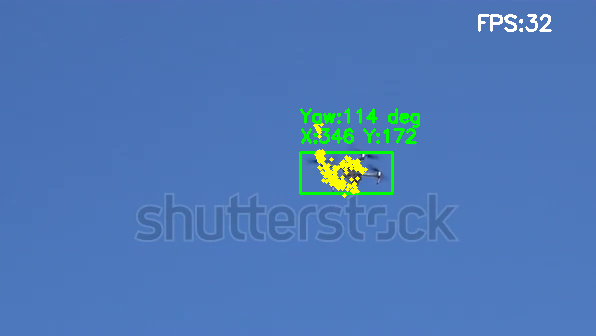

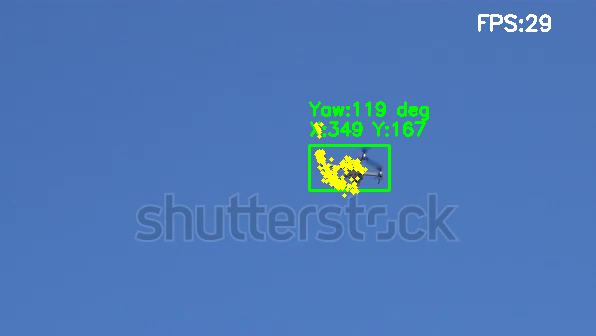

✅ Video finished
✅ output_final.mp4 created


In [13]:
import cv2
import time
import numpy as np
from ultralytics import YOLO
from google.colab.patches import cv2_imshow

# ✅ LOAD TRAINED MODEL
model = YOLO("runs/detect/train/weights/best.pt")
print("✅ Model loaded!")

video_path = "drone.mp4"   # <-- exact name yahan
cap = cv2.VideoCapture(video_path)

fourcc = cv2.VideoWriter_fourcc(*'mp4v')
out = None
first_frame = True
prev_time = time.time()

trajectory = {}
yaw_dict = {}

last_box = None   # ✅ fallback memory when detection drops

frame_idx = 0

while True:
    ret, frame = cap.read()
    if not ret:
        print("✅ Video finished")
        break

    frame_idx += 1
    h, w = frame.shape[:2]

    # ✅ EXTREMELY SENSITIVE YOLO
    results = model.predict(
        frame,
        conf=0.02,     # 🔥 VERY LOW confidence
        iou=0.1,       # 🔥 low IOU
        verbose=False
    )[0]

    boxes = []

    if results.boxes is not None and len(results.boxes) > 0:
        for box in results.boxes.data:
            x1, y1, x2, y2, conf, cls = box.tolist()
            boxes.append([x1, y1, x2, y2, conf])
        last_box = boxes[0]   # ✅ memory store
    else:
        # ✅ fallback: reuse last valid detection
        if last_box is not None:
            boxes.append(last_box)

    for box in boxes:
        x1, y1, x2, y2, conf = box
        x1, y1, x2, y2 = map(int, [x1,y1,x2,y2])

        cx, cy = (x1+x2)//2, (y1+y2)//2

        # ✅ DRAW BOX
        cv2.rectangle(frame, (x1,y1), (x2,y2), (0,255,0), 2)
        cv2.putText(frame, f"X:{cx} Y:{cy}", (x1, y1-10),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0,255,0), 2)

        # ✅ TRAJECTORY
        if 0 not in trajectory:
            trajectory[0] = []
        trajectory[0].append((cx, cy))

        for p in trajectory[0]:
            cv2.circle(frame, p, 2, (0,255,255), -1)

        # ✅ YAW ESTIMATION
        roi = frame[max(0,y1):max(0,y2), max(0,x1):max(0,x2)]
        angle = yaw_dict.get(0, 0)

        try:
            gray = cv2.cvtColor(roi, cv2.COLOR_BGR2GRAY)
            _, th = cv2.threshold(gray, 60, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
            contours, _ = cv2.findContours(th, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

            for cnt in contours:
                if cv2.contourArea(cnt) > 200 and len(cnt) >= 5:
                    ellipse = cv2.fitEllipse(cnt)
                    angle = ellipse[2]
                    yaw_dict[0] = angle
                    break
        except:
            pass

        cv2.putText(frame, f"Yaw:{int(angle)} deg", (x1, y1-30),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0,255,0), 2)

    # ✅ FPS
    curr_time = time.time()
    fps = 1.0 / (curr_time - prev_time + 1e-6)
    prev_time = curr_time
    cv2.putText(frame, f"FPS:{int(fps)}", (w-120,30),
                cv2.FONT_HERSHEY_SIMPLEX, 0.7, (255,255,255), 2)

    if first_frame:
        out = cv2.VideoWriter("output_final.mp4", fourcc, 20, (w, h))
        first_frame = False

    out.write(frame)
    cv2_imshow(frame)

cap.release()
if out is not None:
    out.release()

print("✅ output_final.mp4 created")


In [14]:
from google.colab import files
files.download("output_final.mp4")


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>